In [1]:
# Python packages
import scanpy as sc
import scvi
import bbknn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams

# R interface
from rpy2.robjects import pandas2ri
from rpy2.robjects import r
import rpy2.rinterface_lib.callbacks
import anndata2ri

pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

from datetime import date

DATA_VERSION = date.today()

2024-08-13 15:34:01.662018: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
During startup - Warning messages:
1: Setting LC_CTYPE failed, using "C" 
2: Setting LC_COLLATE failed, using "C" 
3: Setting LC_TIME failed, using "C" 
4: Setting LC_MESSAGES failed, using "C" 
5: Setting LC_MONETARY failed, using "C" 
6: Setting LC_PAPER failed, using "C" 
7: Setting LC_MEASUREMENT failed, using "C" 
/scratch/23700893/ipykernel_3643248/970691884.py:17: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  anndata2ri.activate()


In [2]:
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=100,
    facecolor="white",
    frameon=False,
)

In [ ]:
adata = sc.read("/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/BRO_timecourse/BRO_RA1_exp023_normalized.h5ad")

In [4]:
adata.X = adata.layers['logcounts'].copy() ## originial Seurat normalization

In [5]:
sc.pp.highly_variable_genes(adata, batch_key='Day', flavor='cell_ranger', n_top_genes=4000)

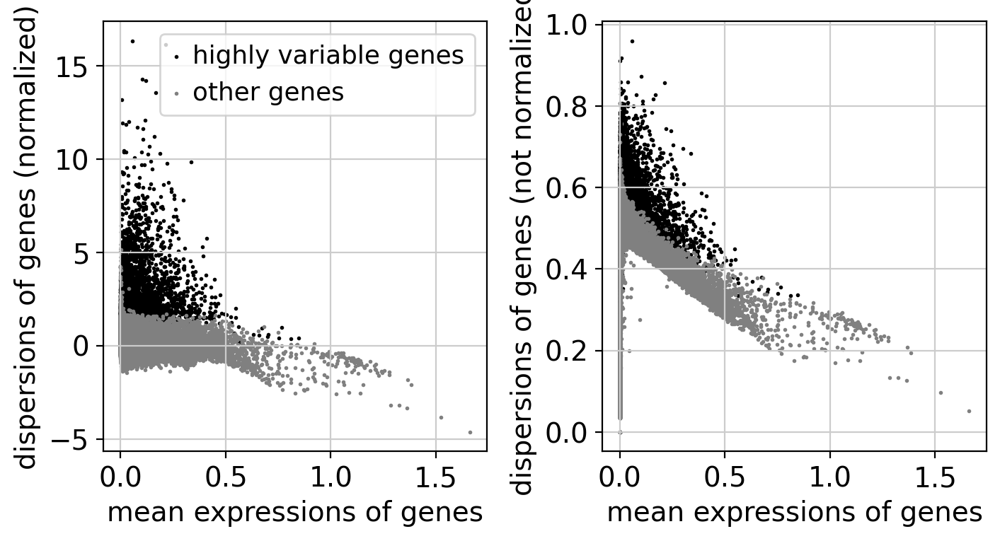

In [6]:
sc.pl.highly_variable_genes(adata)

# Dimensionality reduction

### PCA

In [7]:
# setting highly variable as highly deviant to use scanpy 'use_highly_variable' argument in sc.pp.pca
sc.pp.pca(adata, svd_solver="arpack", use_highly_variable=True)
sc.pp.neighbors(adata)
sc.tl.leiden(adata, resolution=0.5)
sc.tl.umap(adata)

/hpc/pmc_rios/2.personal/rariese/miniconda/envs/scanpy/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:385: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)
/scratch/23700893/ipykernel_3643248/2391784453.py:4: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.5)


In [8]:
sc.tl.leiden(adata, resolution = 1, key_added='leiden_res_1')
sc.tl.leiden(adata, resolution = 2, key_added='leiden_res_2')
sc.tl.leiden(adata, resolution = 3, key_added='leiden_res_3')
sc.tl.leiden(adata, resolution = 4, key_added='leiden_res_4')

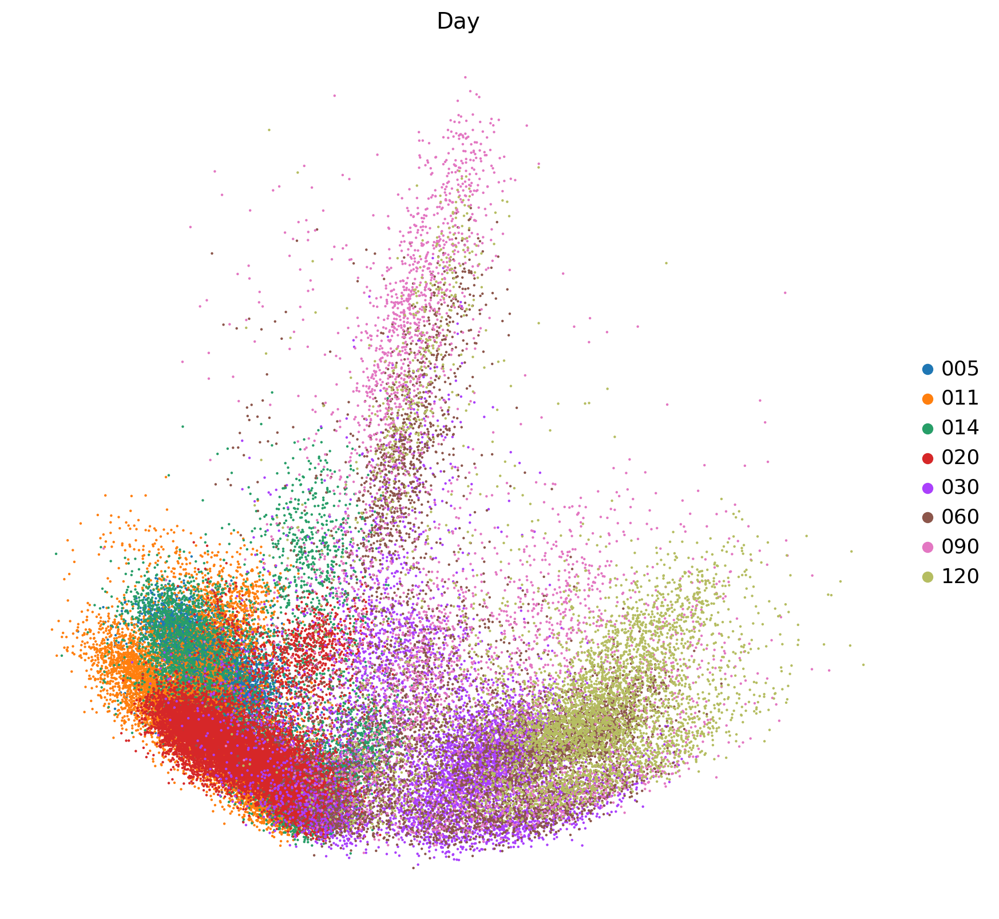

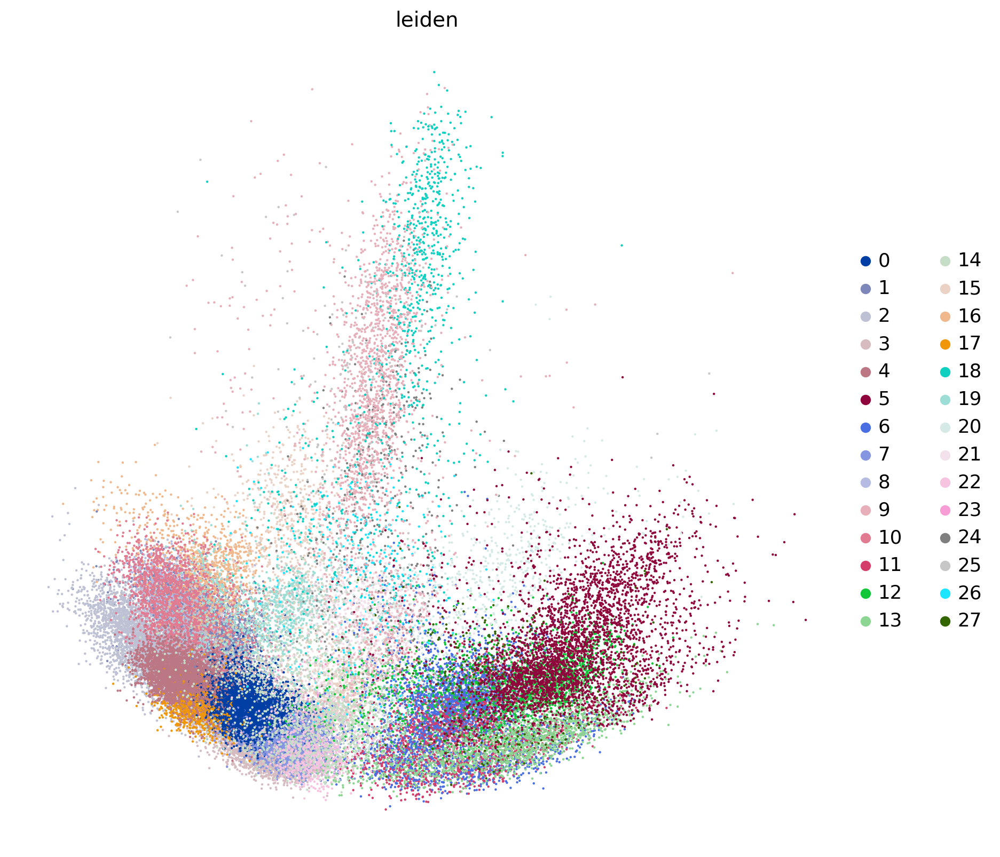

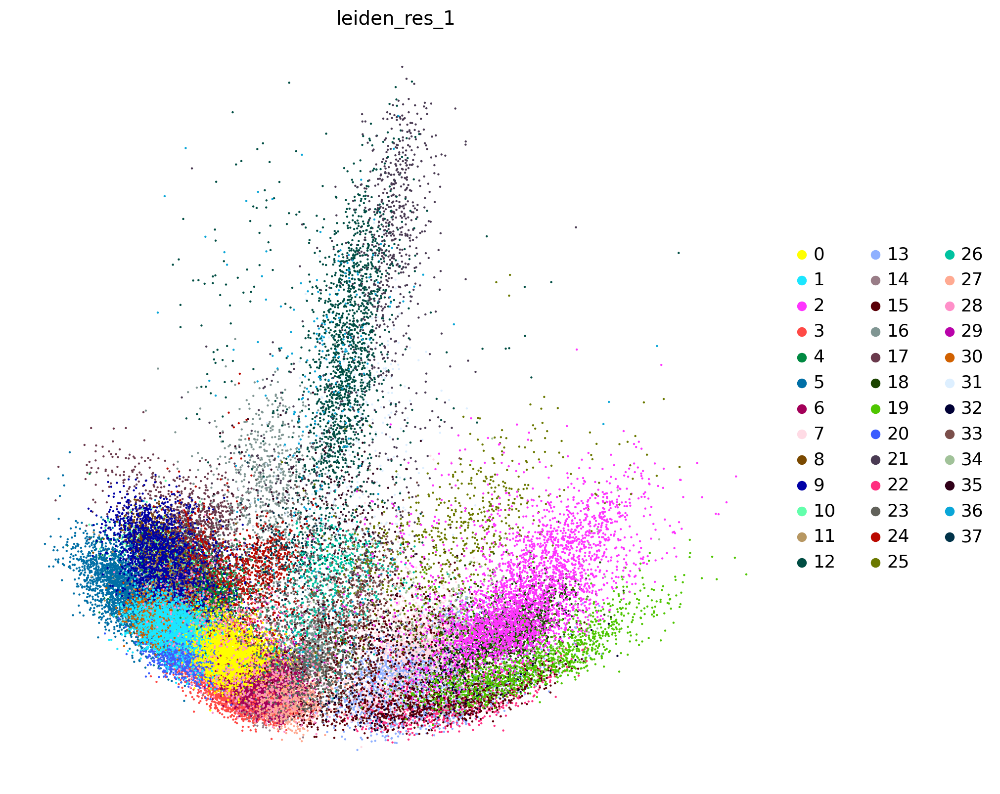

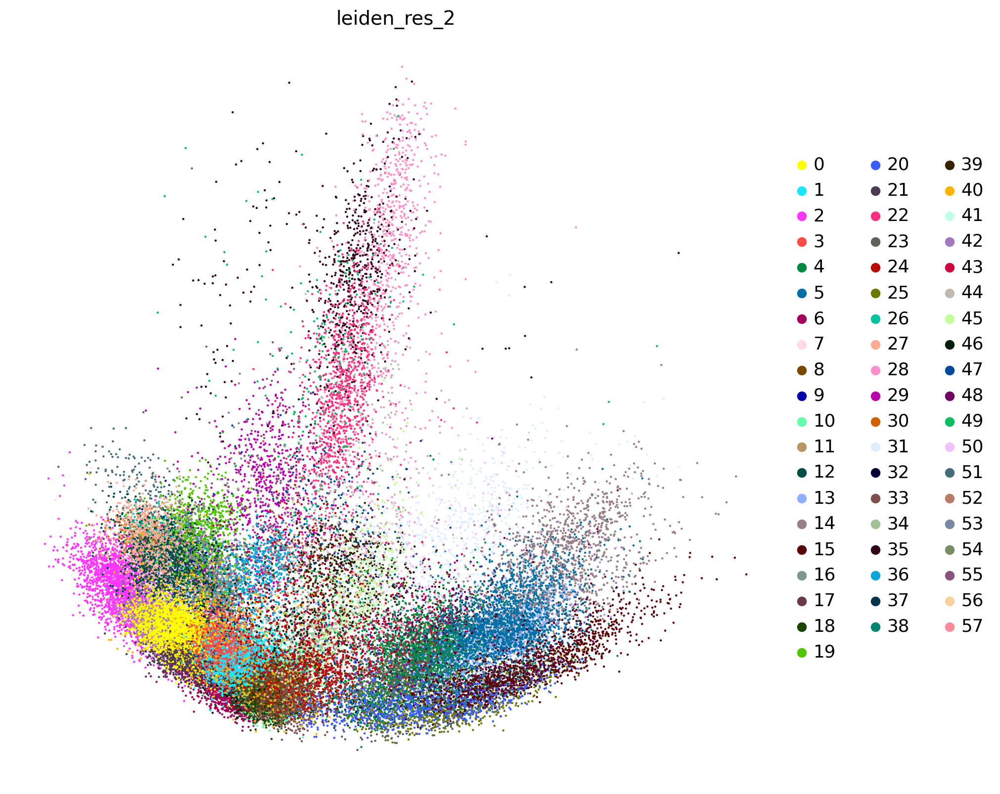

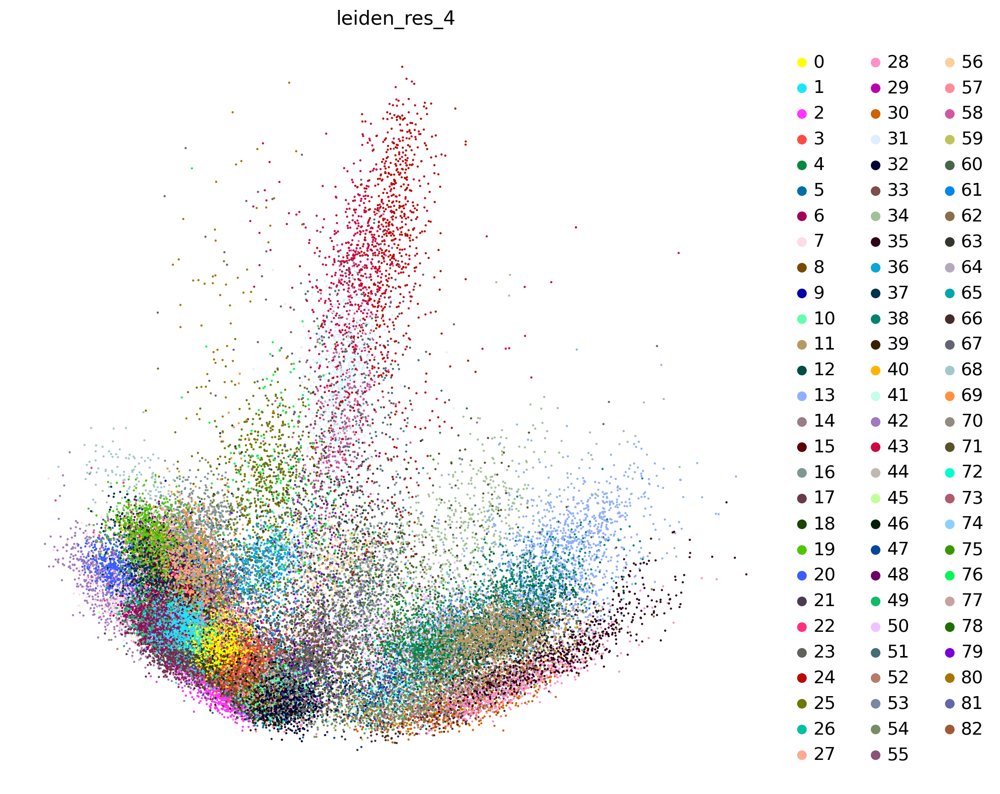

In [11]:
rcParams['figure.figsize']=(10,10)
sc.pl.pca(adata, color='Day', size=10)
sc.pl.pca(adata, color='leiden', size=10)
sc.pl.pca(adata, color='leiden_res_1', size=10)
sc.pl.pca(adata, color='leiden_res_2', size=10)
sc.pl.pca(adata, color='leiden_res_4', size=10)

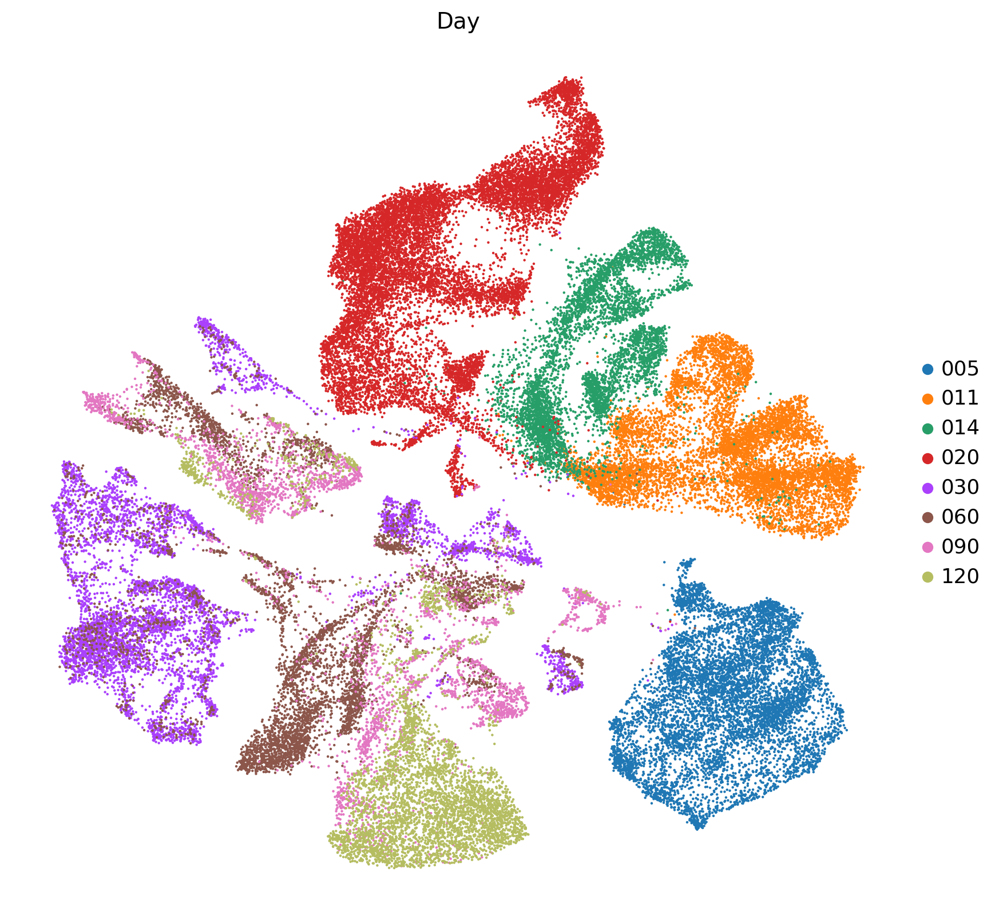

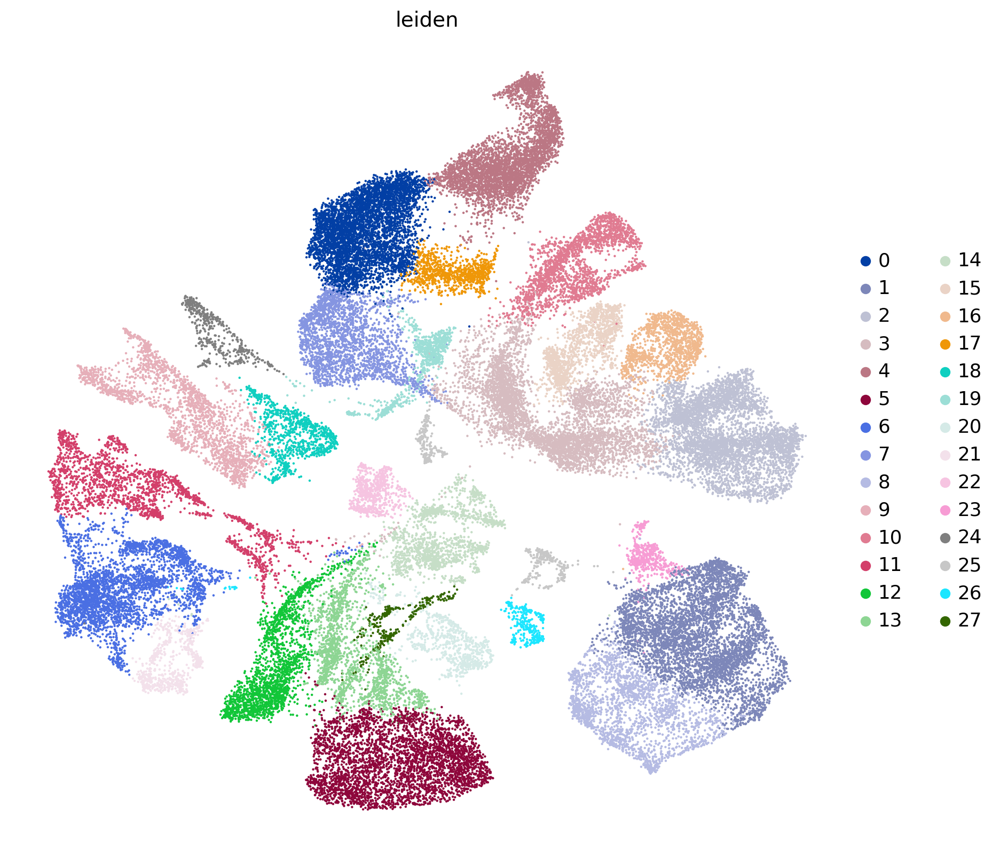

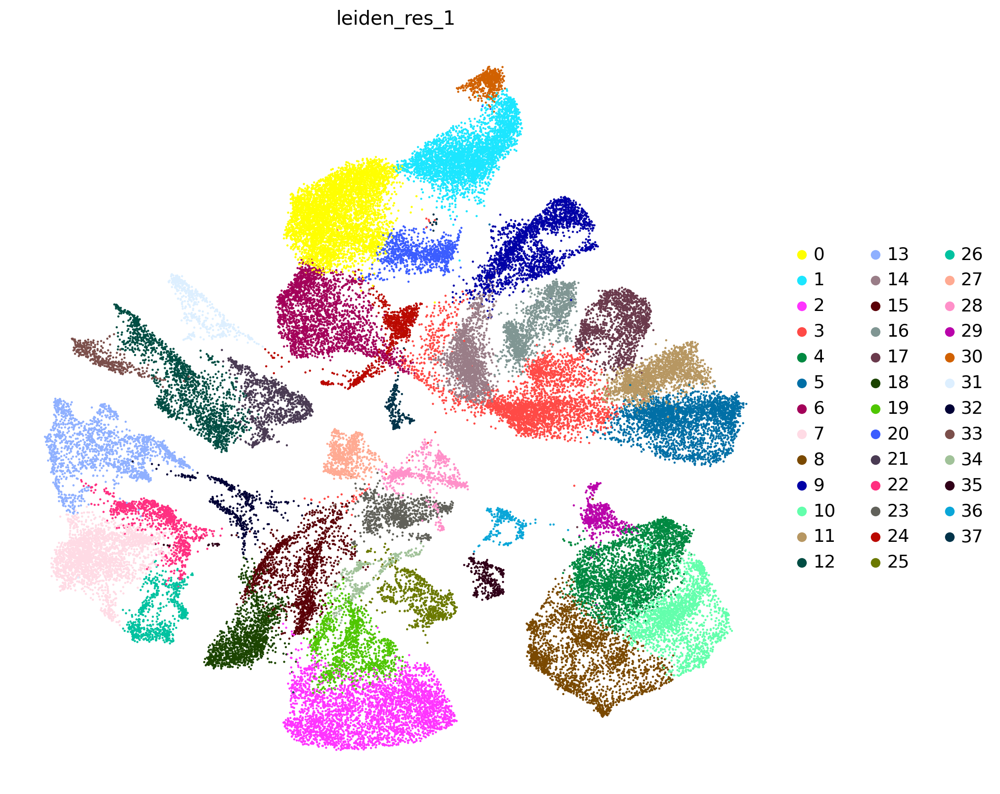

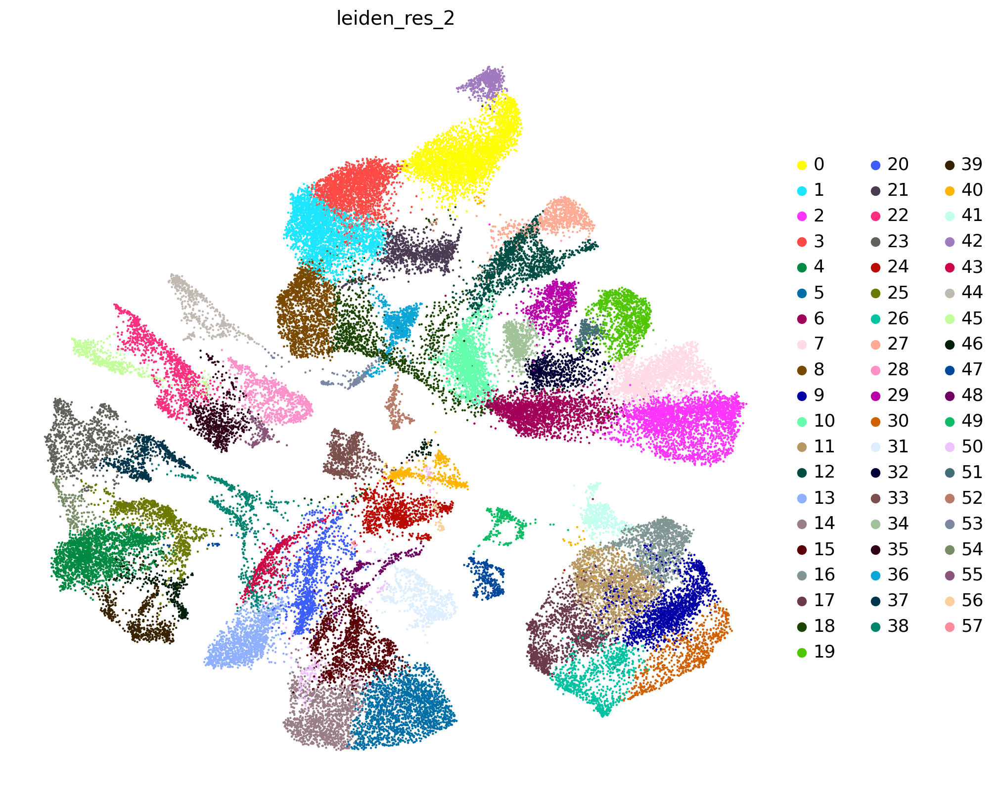

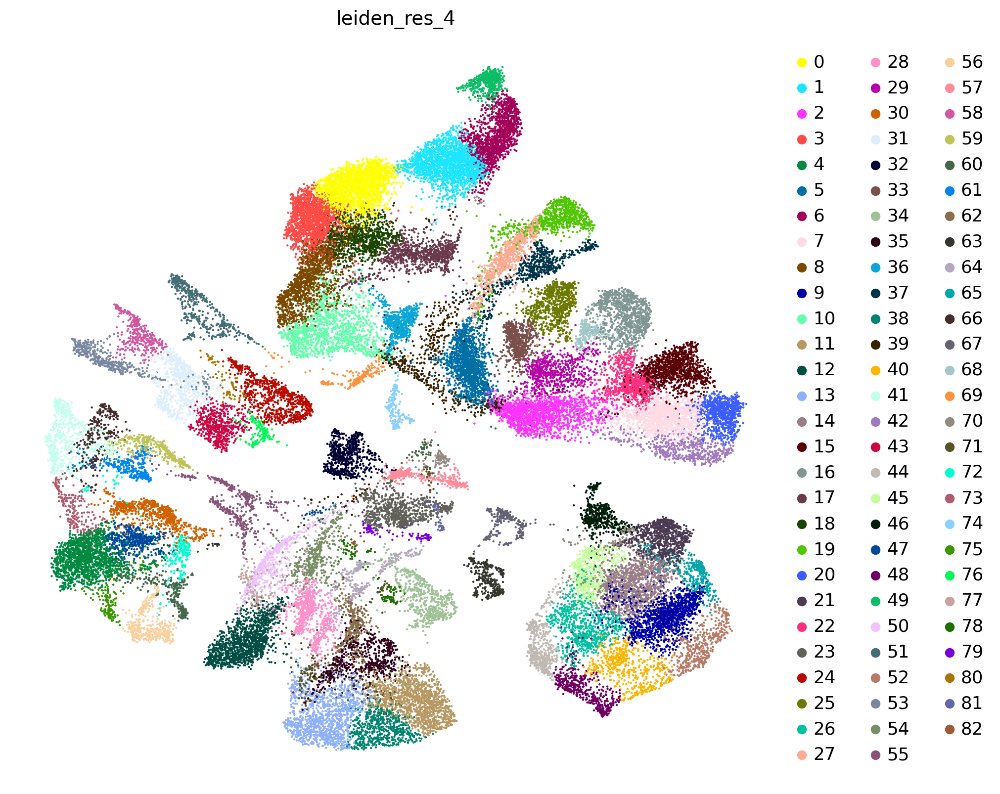

In [10]:
rcParams['figure.figsize']=(10,10)
sc.pl.umap(adata, color='Day', size=10)
sc.pl.umap(adata, color='leiden', size=10)
sc.pl.umap(adata, color='leiden_res_1', size=10)
sc.pl.umap(adata, color='leiden_res_2', size=10)
sc.pl.umap(adata, color='leiden_res_4', size=10)

In [12]:
adata

AnnData object with n_obs × n_vars = 55327 × 38606
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'percent.ribo', 'nCount_SCT', 'nFeature_SCT', 'singlets', 'Day', 'n_counts', 'log_counts', 'n_genes', 'mt_fraction', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'leiden', 'leiden_res_1', 'leiden_res_2', 'leiden_res_3', 'leiden_res_4'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_res_1', 'leiden_res_2', 'leiden_res_3', 'leiden_res_4', 'Day_colors', '

In [ ]:
adata.write_h5ad('/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/BRO_timecourse/BRO_RA1_exp023_dimreduc.h5ad')